In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
pd.options.display.max_rows = 150
pd.options.display.max_columns = 150

In [3]:
df = pd.read_csv("data/data_merge.csv")

In [4]:
num_columns = [col for col in df.columns if df[col].dtype != "object"]
cat_columns = [col for col in df.columns if df[col].dtype == "object"]

In [5]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import  StandardScaler,OneHotEncoder,FunctionTransformer
from sklearn.decomposition import PCA,TruncatedSVD
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE

In [6]:
std = StandardScaler()
ohe= OneHotEncoder(sparse_output=False)

log_1p = FunctionTransformer(func=np.log1p)
preprocessor_pca = ColumnTransformer(
    transformers=[
        ("ohe",ohe,cat_columns),
        ("log",log_1p,num_columns)
    ]
    
)
tsne=Pipeline([
     ('preprocessor', preprocessor_pca),
     ('std', std ),
     ("tsne", TSNE(n_components=3,random_state=42,verbose=2,n_jobs=-1))
])

tsne_value = tsne.fit_transform(df)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 92901 samples in 0.002s...
[t-SNE] Computed neighbors for 92901 samples in 3.895s...
[t-SNE] Computed conditional probabilities for sample 1000 / 92901
[t-SNE] Computed conditional probabilities for sample 2000 / 92901
[t-SNE] Computed conditional probabilities for sample 3000 / 92901
[t-SNE] Computed conditional probabilities for sample 4000 / 92901
[t-SNE] Computed conditional probabilities for sample 5000 / 92901
[t-SNE] Computed conditional probabilities for sample 6000 / 92901
[t-SNE] Computed conditional probabilities for sample 7000 / 92901
[t-SNE] Computed conditional probabilities for sample 8000 / 92901
[t-SNE] Computed conditional probabilities for sample 9000 / 92901
[t-SNE] Computed conditional probabilities for sample 10000 / 92901
[t-SNE] Computed conditional probabilities for sample 11000 / 92901
[t-SNE] Computed conditional probabilities for sample 12000 / 92901
[t-SNE] Computed conditional probabilities for sam

In [7]:
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.datasets import make_blobs
# from sklearn.cluster import KMeans
# from sklearn.metrics import adjusted_rand_score

# # Générer un ensemble de données avec 4 clusters
# X, y_true = make_blobs(n_samples=500, centers=4, random_state=42)

# # Calculer l'ARI pour différentes valeurs de k
# ari_scores = []
# k_values = range(1, 10)
# for k in k_values:
#     kmeans = KMeans(n_clusters=k, random_state=42)
#     y_pred = kmeans.fit_predict(X)
#     ari = adjusted_rand_score(y_true, y_pred)
#     ari_scores.append(ari)

# # Afficher le graphique de l'ARI
# plt.plot(k_values, ari_scores, '-o')
# plt.xlabel('Nombre de clusters (k)')
# plt.ylabel('ARI')
# plt.title('Performance de K-means en fonction de k')
# plt.show()

In [8]:
import pickle
pickle_out = open("tsne_zol.pkl", "wb") 
pickle.dump(tsne_value, pickle_out) 
pickle_out.close()

In [9]:
# import pickle
# pickle_in = open("tsne_zol.pkl", "rb") 
# tsne_value = pickle.load(pickle_in) 
# pickle_in.close()

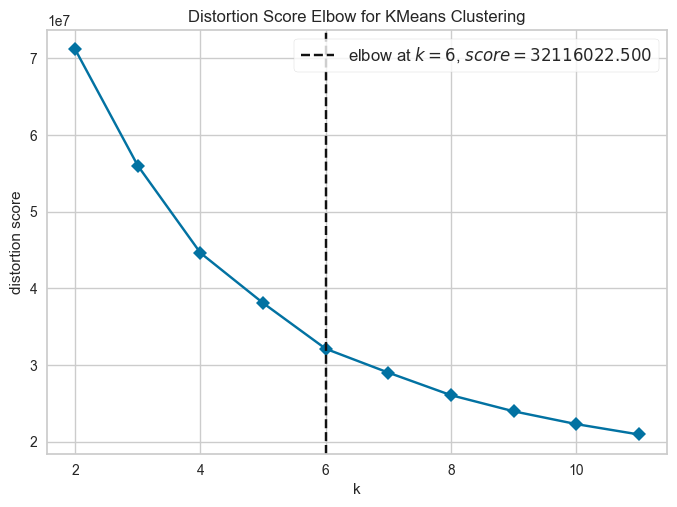

<AxesSubplot: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [10]:
from yellowbrick.cluster import KElbowVisualizer
visualizer = KElbowVisualizer(KMeans(n_init=10,random_state=42),metric="distortion", k=(2,12),timings=False)

visualizer.fit(tsne_value)        # Fit the data to the visualizer
visualizer.show()                 # Finalize and render the figure

In [11]:
kmeans = KMeans(n_clusters=6,n_init=10,random_state=42)
kmeans.fit(tsne_value)

KMeans(n_clusters=6, n_init=10, random_state=42)

In [12]:
df["label"]=kmeans.labels_

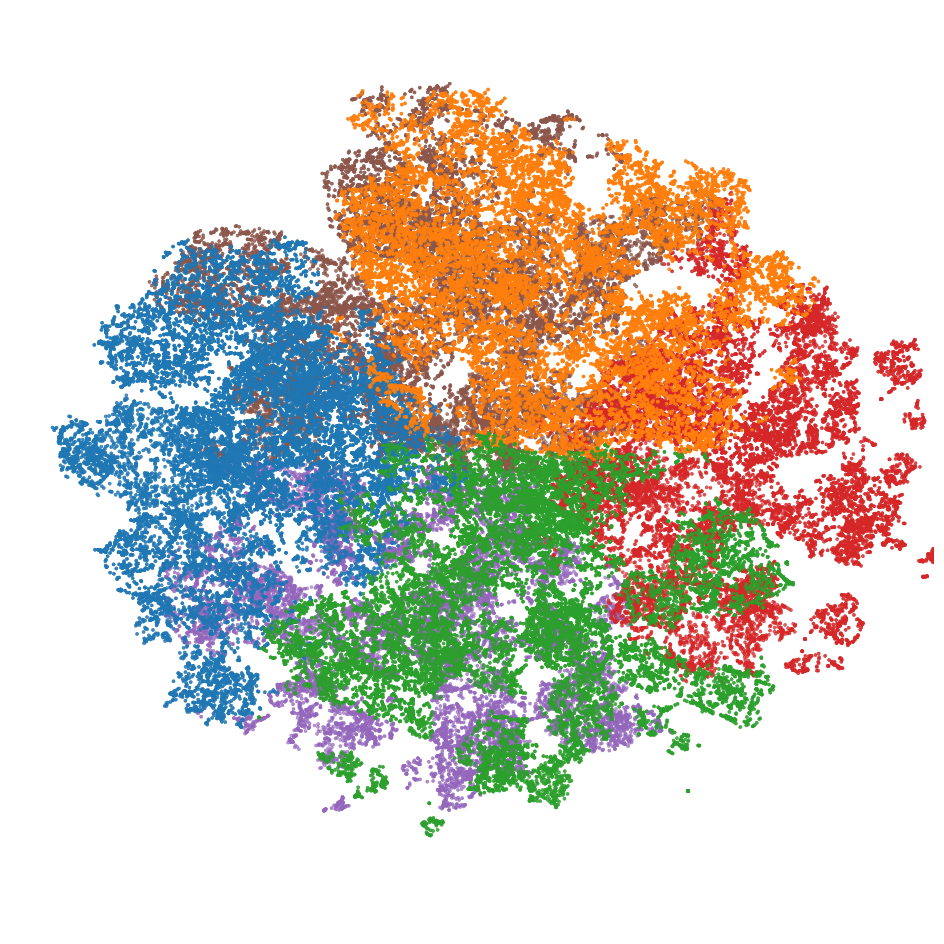

In [34]:
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Creation figure et axes
fig = plt.figure()
fig.set_size_inches(8,8)
ax = fig.add_subplot(111, projection='3d')

RADIUS = 58.0  # Control this value.
ax.set_xlim3d(-RADIUS / 2, RADIUS / 2)
ax.set_zlim3d(-RADIUS / 2, RADIUS / 2)
ax.set_ylim3d(-RADIUS / 2, RADIUS / 2)
ax.set_axis_off()

# Creation d'une liste de couleurs pour une meilleure lecture des clusters
set1_colors = list(mcolors.TABLEAU_COLORS.values())[:10]
color_dict = {i: set1_colors[i] for i in range(len(set1_colors))}

frame_count = 400
half_frame_count = frame_count / 2
max_elevation = 90
step = max_elevation / half_frame_count

def init():
    ax.scatter3D(tsne_value[:,0],tsne_value[:,1],tsne_value[:,2],marker=".",c=[color_dict[i] for i in df["label"]])
    return fig

def animate(i):
    if i<half_frame_count:
        ax.view_init(elev=i*step-max_elevation/2, azim=i*720/frame_count)
        return fig
    else:
        ax.view_init(elev=max_elevation/2-(i-half_frame_count)*step, azim=i*720/frame_count)
        return fig

ani = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=frame_count, interval=100, blit=False)

metadata = dict(title='Scatter3D_Video', artist='Matplotlib', comment='')
writer = animation.FFMpegWriter(fps=25, metadata=metadata, bitrate=4000)
ani.save('scatter3D_animation.mp4', writer=writer)

import io
import base64
from IPython.display import HTML

video = io.open('scatter3D_animation.mp4', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>

<source src="data:video/mp4;base64,{0}" type="video/mp4" /> </video>'''.format(encoded.decode('ascii')))

In [ ]:
stop here

import io
import base64
from IPython.display import HTML

video = io.open('scatter3D_animation.mp4', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>

<source src="data:video/mp4;base64,{0}" type="video/mp4" /> </video>'''.format(encoded.decode('ascii')))

In [ ]:
# Generating random data 
data = np.random.rand(100)+np.random.randint(100)

# Initializing KMeans 
kmeans = KMeans(2) 

# Fitting with inputs 
kmeans = kmeans.fit(data.reshape(-1,1)) 

# Predicting the clusters 
labels = kmeans.predict(data.reshape(-1,1)) 

# Getting the cluster centers 
C = kmeans.cluster_centers_ 

#Calculating the Adjusted Rand Score
score = adjusted_rand_score(data, labels) 

print("ARI score: ", score)

In [ ]:
%matplotlib inline
import matplotlib.colors as mcolors
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
# Créer une liste de couleurs à partir de la palette "Set1" de Matplotlib
set1_colors = list(mcolors.TABLEAU_COLORS.values())[:10]

# Créer un dictionnaire pour mapper des couleurs aux valeurs de la liste
color_dict = {i: set1_colors[i] for i in range(len(set1_colors))}
print(color_dict)

ax.scatter(tsne_value[:,0],tsne_value[:,1],tsne_value[:,2],marker=".",c=[color_dict[i] for i in df["label"]])
plt.show()

In [ ]:
result = df.groupby(['label']).mean()
result

In [ ]:
import plotly.graph_objects as go

categories = result.columns
fig = go.Figure()

for g in result.index:
    fig.add_trace(go.Scatterpolar(
        r = result.loc[g].values,
        theta = categories,
        fill = 'toself',
        name = f'cluster #{g}'
    ))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[0, 5] # here we can define the range
    )),
  showlegend=True,
    title="Issues with Plotly",
    title_x=0.5
)

fig.show()

In [ ]:
test

In [ ]:
from kmodes.kprototypes import KPrototypes
catColumnsPos = [df.columns.get_loc(col) for col in list(df.select_dtypes('object').columns)]

model_Kproto = KPrototypes(n_clusters=4, init="Cao", verbose=2, n_jobs=-1, n_init=8, random_state=42)
df_std = df
df_std[num_columns] = preprocessor.fit_transform(df[num_columns])
model_Kproto.fit_predict(df_std, categorical = catColumnsPos)

In [ ]:
centroides = pca.transform(pd.DataFrame(model_Kproto.cluster_centroids_,columns=df[num_columns+cat_columns].columns))
plt.scatter(pca_value[:,0],pca_value[:,1],c=model_Kproto.labels_,marker=".",s=10)
for center in centroides:
    plt.scatter(center[0],center[1],marker='x',c='r',s=20)